In [1]:
%load_ext autoreload
%autoreload 2

In [16]:
import sys
sys.path.insert(0,'/groups/astro/troels/python')
sys.path.insert(0,'/groups/astro/troels/python/sfrimann')
import numpy as np
import matplotlib.pyplot as plt
from pyramses import rsink
import osyris
from osyris.plot.direction import get_direction

In [3]:
class units_class():
    def __init__(self):
        # constants
        self.au = 14959787070000                  # 1 au in cm
        self.pc = self.au * 3600. * 180. / np.pi  # 1 parsec in cm
        self.yr = 3600. * 24. * 365.25            # astronomical year in seconds
        self.msun = 1.98847e33                    # solar masses in g
        
        # cgs units
        self.lcgs = 4. * self.pc                  # 4 parsec in cm
        self.vcgs = 1.8e4                         # 0.18 km/s
        self.tcgs = self.lcgs / self.vcgs         # 21.7 Myr in seconds
        
        # natural units
        self.l = self.lcgs / self.au              # box size in AU
        self.v = 0.18                             # velocity in km/s
        self.t = self.tcgs / self.yr              # time in yr
        self.n = 798.                             # number density in ppc
        self.m = 2998.                            # mass in solar masses
        self.d = (self.m * self.msun) / self.lcgs**3 # density in g / cm^-3

In [4]:
# load data
def load_data(nout,unit,datadir='data',selection=None):
    ds = osyris.Dataset(nout, path=datadir)
    # overwrite units
    ds.meta['unit_l'] = unit.lcgs
    ds.meta['unit_t'] = unit.tcgs
    ds.meta['unit_d'] = unit.d
    ds.set_units()
    # load data set
    if selection == None:
        data = ds.load()
    else:
        data = ds.load(selection)
        
    return ds, data

In [5]:
def load_protostar(isink,nout,unit,datadir='data'):
    s=rsink(nout,datadir=datadir)

    # redefine center based on sink position (reuse dict above to make it work)
    center = osyris.Vector(x=s['x'][isink]*unit.l,y=s['y'][isink]*unit.l,z=s['z'][isink]*unit.l,unit=osyris.units('au'))

    # get mass in msun and age in kyr
    mass = s['m'][isink]*unit.m*osyris.units('M_sun')
    age = (s['snapshot_time'] - s['tcreate'][isink])*unit.t*osyris.units('yr')

    # print some info
    print("Snapshot, sink    :", nout, isink)
    print("Position          :", center)
    print("Mass              :", mass)
    print("Age of first star :", age)
    
    return center, age, mass, s

In [6]:
def plot_state(data,nout,center,age,mass,resolution=1000, dmin=None, dmax=None, vmin=1e-15, vmax=3e-11, view=100, depth=0.2, direction=None,vscale=None,nplot=3,do_title=True,do_xlabel=True,fontsize=20):

    fig, ax = plt.subplots(1, 3, figsize=(20*nplot, 14.56))

    if do_title:
        fig.suptitle("Age: {:.2f} kyr  Mass: {:.2f} M$_\odot$".format(age.magnitude*1e-3,mass.magnitude), fontsize=fontsize+3)

    # obtain directional vectors for proper view of protostar
    if direction==None:
        dir_vecs = get_direction(direction="top",
                                 dataset=data,
                                 dx=view,
                                 dy=view,
                                 origin=center)
    elif isinstance(direction, str):
        dir_vecs = get_direction(direction=direction,
                                 dataset=data,
                                 dx=view,
                                 dy=view,
                                 origin=center)
    else:
        dir_vecs = direction

    # rotate view to be the side view
    dir_vecs2 = dir_vecs.copy()
    dir_vecs2['normal'] = dir_vecs['pos_u']
    dir_vecs2['pos_u'] = dir_vecs['pos_v']
    dir_vecs2['pos_v'] = dir_vecs['normal']

    # rotate view to be the other side view (swap of axis so that outflow is not side-ways)
    dir_vecs3 = dir_vecs2.copy()
    dir_vecs3['normal'] = dir_vecs['pos_v']
    dir_vecs3['pos_u'] = dir_vecs['pos_u']
    dir_vecs3['pos_v'] = dir_vecs['normal']

    osyris.map({"data": data["hydro"]["density"], "norm": "log", "vmin": dmin, "vmax": dmax}, # layer 1
               {"data": data["hydro"]["velocity"], "mode": "vec", "scale": vscale, "vmin": vmin, "vmax": vmax}, # layer 2
               dx=view,
               dz=depth*view,
               origin=center, direction=dir_vecs,
               resolution=resolution, ax=ax[0]
              )
    if do_xlabel:
        ax[0].set_xlabel('x [au]', fontsize=fontsize)
    else:
        ax[0].set_xlabel('', fontsize=fontsize)
    ax[0].set_ylabel('y [au]', fontsize=fontsize)
    
    if nplot >= 2:
        osyris.map({"data": data["hydro"]["density"], "norm": "log", "vmin": dmin, "vmax": dmax}, # layer 1
                {"data": data["hydro"]["velocity"], "mode": "vec", "scale": vscale, "vmin": vmin, "vmax": vmax}, # layer 2
                dx=view,
                dz=depth*view,
                origin=center, direction=dir_vecs2,
                resolution=resolution, ax=ax[1]
                )
        if do_xlabel:
            ax[1].set_xlabel('y [au]', fontsize=fontsize)
        else:
            ax[1].set_xlabel('', fontsize=fontsize)
        ax[1].set_ylabel('z [au]', fontsize=fontsize)

    if nplot >= 3:
        osyris.map({"data": data["hydro"]["density"], "norm": "log", "vmin": dmin, "vmax": dmax}, # layer 1
                {"data": data["hydro"]["velocity"], "mode": "vec", "scale": vscale, "vmin": vmin, "vmax": vmax}, # layer 2
                dx=view,
                dz=depth*view,
                origin=center, direction=dir_vecs3,
                resolution=resolution, ax=ax[2]
                )
        if do_xlabel:
            ax[2].set_xlabel('x [au]', fontsize=fontsize)
        else:
            ax[2].set_xlabel('', fontsize=fontsize)
        ax[2].set_ylabel('z [au]', fontsize=fontsize)
    
    for i in range(nplot):
        ax[i].axis('equal')

    fname = 'sink_13_lvl26_'+str(view.magnitude)+'au_'+str(nout)+'.png'
    fig.savefig(fname=fname,dpi=300,bbox_inches='tight')

In [7]:
# set protostar number and folder where to find data
datadir='./data'
isink=13
# load units for easy conversion and set viewing direction for plots
unit = units_class()
direction=None

In [8]:
nout = 911
center, age, mass, s = load_protostar(isink,nout,unit,datadir=datadir)
ds, data = load_data(nout,unit,datadir=datadir)

FileNotFoundError: [Errno 2] No such file or directory: './data/output_00911/stars_output.dat'

In [ ]:
view=10*osyris.units('au')
dir_vecs = get_direction(direction="top",dataset=data,dx=view,dy=view,origin=center)
unit_x = dir_vecs['pos_u'] # Cartesian unit vector in the x-direction with respect to the disk orientation
unit_y = dir_vecs['pos_v'] # Cartesian unit vector in the y-direction with respect to the disk orientation
unit_z = dir_vecs['normal'] # Cartesian unit vector in the z-direction with respect to the disk orientation -- spin direction
print(unit_x, unit_y, unit_z)

Basis vectors:
'normal' Value: 2.831e+15, -1.031e+15, -1.162e+15 [M_sun * cm ** 2 / s] (), {x,y,z}
'pos_u' Value: 1.0, 1.0, 1.550 [M_sun * cm ** 2 / s] (), {x,y,z}
'pos_v' Value: -4.360e+14, -5.549e+15, 3.863e+15 [M_sun ** 2 * cm ** 4 / s ** 2] (), {x,y,z}
'pos_u' Value: 0.477, 0.477, 0.739 [] (), {x,y,z} 'pos_v' Value: -0.064, -0.819, 0.570 [] (), {x,y,z} 'normal' Value: 0.877, -0.319, -0.360 [] (), {x,y,z}


In [ ]:
# Defining relative velocity vector
v_rel_x = (data['hydro']['velocity'].x.to("km/s").values - s["ux"][isink] * unit.v)
v_rel_y = (data['hydro']['velocity'].y.to("km/s").values - s["uy"][isink] * unit.v)
v_rel_z = (data['hydro']['velocity'].z.to("km/s").values - s["uz"][isink] * unit.v)
data['hydro']['velrel'] = osyris.Vector(v_rel_x, v_rel_y, v_rel_z,unit=osyris.units('km/s'))

In [ ]:
# Relative position vector with respect to Sink particle (disk coordinate system)
data['amr']['posnew'] = data['amr']['position'] - center

# Define z-coordinate and z-vector for all cells
data['amr']['z_c'] = data['amr']['posnew'].dot(unit_z) # Z-coordinate
data['amr']['z_vec'] = data['amr']['z_c']*unit_z       # Z vector in general coordinate system

# Define R-coordinate and R-vector for all cells
data['amr']['R_vec'] = data['amr']['posnew'] - data['amr']['z_vec'] # R vector in general coordinate system
data['amr']['R_c'] = data['amr']['R_vec'].norm # cylindrical radius coordinate in disk coordinate system
unit_R = data['amr']['R_vec'] / data['amr']['R_c'] # unit vector in cylindrical coordinate system

# Define angular phi vector for all cells
unit_phi = unit_R.cross(unit_z) # unit vector in cylindrical coordinate system
data['amr']['phi_c'] = data['amr']['posnew'].dot(unit_phi) # angular phi coordinate in disk coordinate system

In [ ]:
# Get cylindrical coordinate vectors for all cells in disk coordinate system
data['hydro']['vel_R'] = data['hydro']['velrel'].dot(unit_R)
data['hydro']['vel_phi'] = data['hydro']['velrel'].dot(unit_phi)
data['hydro']['vel_z'] = data['hydro']['velrel'].dot(unit_z)

In [ ]:
# The cylindrical unit vectors (unit_Rc,unit_phic,unit_z)
print(unit_R.x, unit_R.y, unit_R.z)
print(unit_phi.x, unit_phi.y, unit_phi.z)
print(unit_z)

'_x' Min: -0.481 Max: 0.481 [] (26484676,) '_y' Min: -0.948 Max: 0.948 [] (26484676,) '_z' Min: -0.933 Max: 0.933 [] (26484676,)
'_x' Min: -0.481 Max: 0.481 [] (26484676,) '_y' Min: -0.948 Max: 0.948 [] (26484676,) '_z' Min: -0.933 Max: 0.933 [] (26484676,)
'normal' Value: 0.877, -0.319, -0.360 [] (), {x,y,z}


In [ ]:
# defining cylindrical velocities
data['hydro']['vel_R_c'] = data['hydro']['velrel'].dot(unit_Rc)
data['hydro']['vel_phic'] = data['hydro']['velrel'].dot(unit_phic)
data['hydro']['vel_z'] = data['hydro']['velrel'].dot(unit_z)
data['hydro']['vel_disk'] = data['hydro']['velrel'] - data['hydro']['vel_z'] * unit_z

In [ ]:
### Define cylindrical disk ###
mask = np.where(np.abs(data['amr']['z_c']) < 0.3*data['amr']['R_c'])[0]

In [ ]:
data['hydro'].keys()

dict_keys(['density', 'thermal_pressure', 'velocity', 'B_left', 'B_right', 'B_field', 'mass', 'velrel', 'vel_R_c', 'vel_phic', 'vel_z', 'vel_disk'])

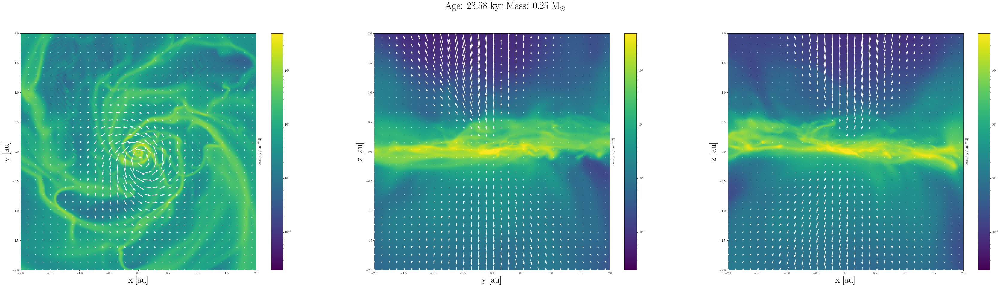

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=5e2, vmin=1e-15, vmax=3e-11, depth=1,
           view=4*osyris.units('au'), direction=dir_vecs,
           vscale=1e22,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

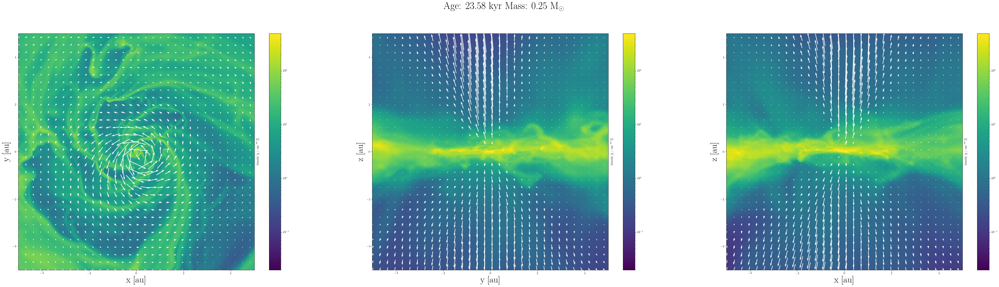

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=5e2, vmin=1e-15, vmax=3e-11, depth=1,
           view=10*osyris.units('au'), direction=dir_vecs,
           vscale=1e22,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

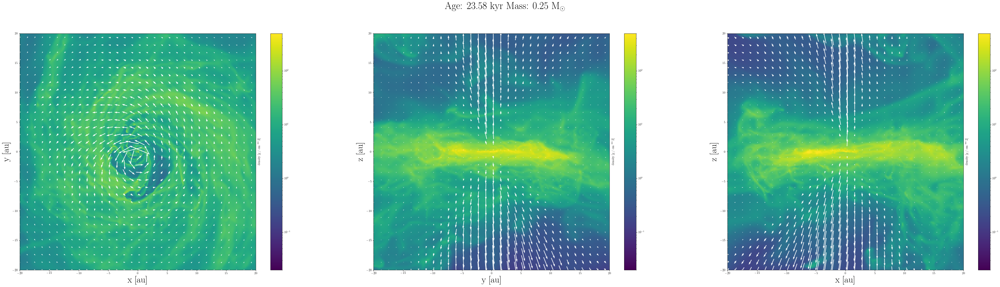

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=5e2, vmin=1e-15, vmax=3e-11, depth=1,
           view=40*osyris.units('au'), direction=dir_vecs,
           vscale=2e22,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

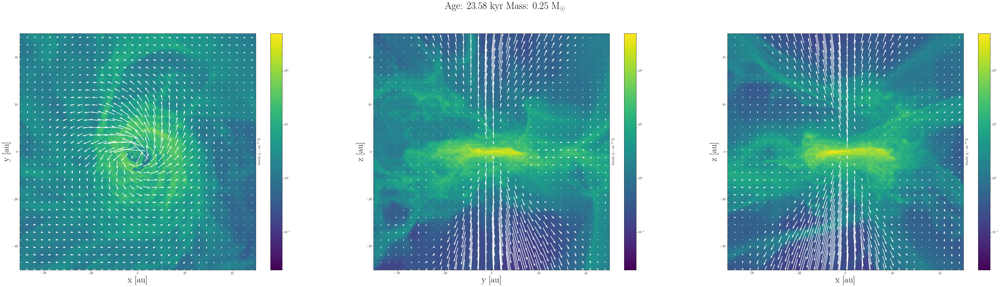

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=5e2, vmin=1e-15, vmax=3e-11, depth=1,
           view=100*osyris.units('au'), direction=dir_vecs,
           vscale=2e22,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

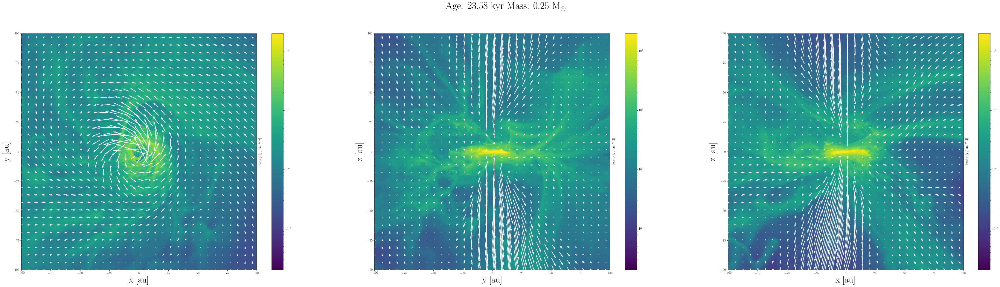

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=2e2, vmin=1e-15, vmax=3e-11, depth=1,
           view=200*osyris.units('au'), direction=dir_vecs,
           vscale=2e22,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

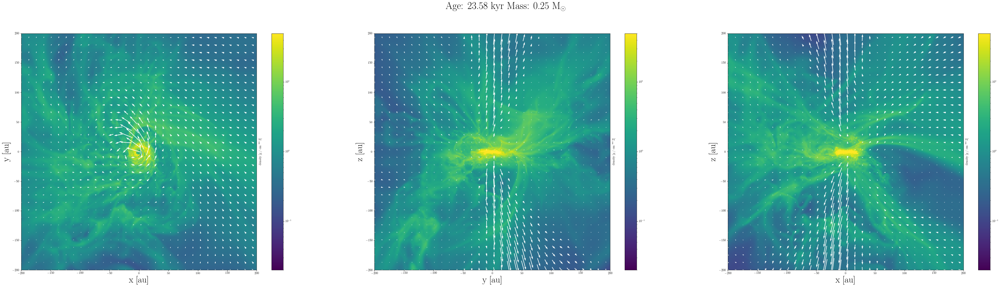

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=5e1, vmin=1e-15, vmax=3e-11, depth=1,
           view=400*osyris.units('au'), direction=dir_vecs,
           vscale=5e22,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

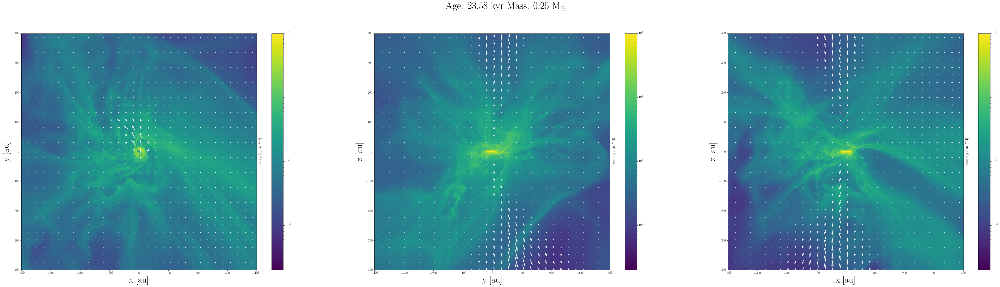

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=1e2, vmin=1e-15, vmax=3e-11, depth=1,
           view=800*osyris.units('au'), direction=dir_vecs,
           vscale=2e23,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

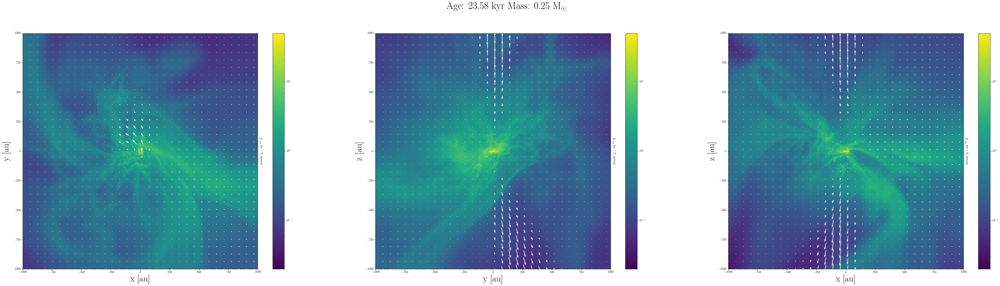

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=5e1, vmin=1e-15, vmax=3e-11, depth=1,
           view=2000*osyris.units('au'), direction=dir_vecs,
           vscale=4e23,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

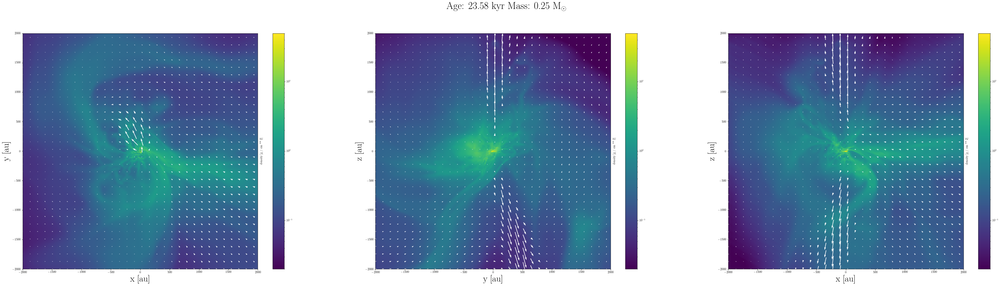

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-2, dmax=5e1, vmin=1e-15, vmax=3e-11, depth=1,
           view=4000*osyris.units('au'), direction=dir_vecs,
           vscale=4e23,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

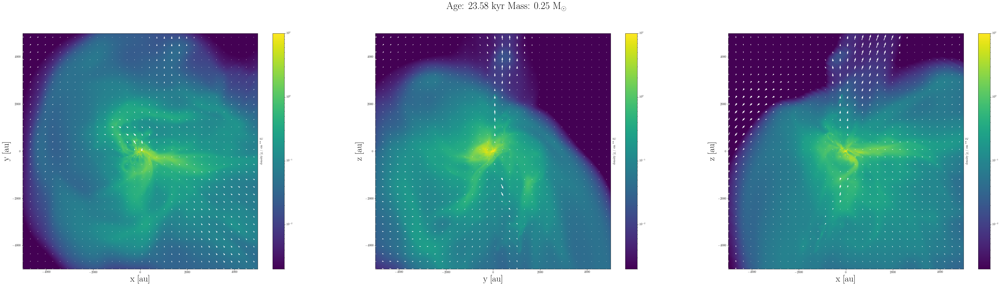

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-3, dmax=1e1, vmin=1e-15, vmax=3e-11, depth=1,
           view=10000*osyris.units('au'), direction=dir_vecs,
           vscale=1e24,nplot=3,do_title=True,do_xlabel=True,fontsize=30)

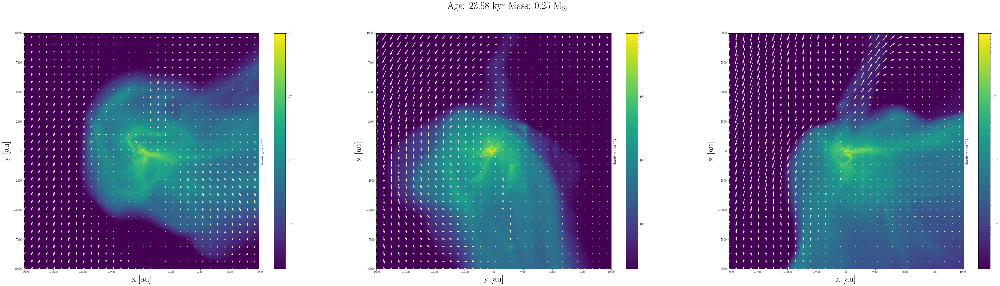

In [ ]:
plot_state(data,nout,center,age,mass,resolution=600,
           dmin=2e-3, dmax=1e1, vmin=1e-15, vmax=3e-11, depth=1,
           view=20000*osyris.units('au'), direction=dir_vecs,
           vscale=1e24,nplot=3,do_title=True,do_xlabel=True,fontsize=30)